In [1]:
import re
import os 
import sys 

import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage import io

from pathlib import Path
from tqdm.notebook import trange, tqdm
import h5py
import pandas as pd
import scanpy as sc
sc.settings.verbosity = 3

from matplotlib.pyplot import rc_context
from matplotlib import cm, colors
import matplotlib
sc.set_figure_params(format='png')
from PIL import Image
import seaborn as sns 
import anndata as ad


In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [3]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)


In [4]:
all_donor = [
    "LN Donor A",
    "LN Donor E",
    "INT Donor B",
    "INT Donor E",
    "TS Donor A",
    "TS Donor E",
]


# Import data

## Read fsc

In [5]:
# Cell type order define based on flow jo gating strategy
cell_type_order = ['Stromal cells', 
                   'B cells', 'GC B-cells', 'DZ B-cells', 'LZ B-cells', 
                   'Plasma Cells', 'FDCs',  
                   'T cells', 'Cytotoxic T-cells', 'Exhausted T-cells', 'Follicular CD8+ T-cells', 'Helper T-cells', 'Follicular Helper T-cells', 'Regulatory T-cells']


In [6]:
gating_path = data_dir / "gating_final" 
dfs = []

for name in cell_type_order:
    df = pd.read_csv(gating_path / f"export_null_{name}.csv")
    df['Phenotype'] = name.split('_')[-1]
    dfs.append(df)                 

# for (dirpath, dirnames, filenames) in os.walk(gating_path):
#     for name in sorted(filenames):
#         if 'csv' in name:
#             print(name)
#             df = pd.read_csv(os.path.join(dirpath, name))
#             df['Phenotype'] = name.split('_')[-1][:-4]
#             dfs.append(df)

In [7]:
df = pd.concat(dfs)

In [8]:
df

,BCL6,C-Myc,CD11b,CD11c,CD138,CD20,CD21,CD27,CD3,CD38,...,H3K27me3,ICOS1,Ki67,PD1,ROI,Vimentin,X,Y,index,Phenotype
0,0.0,1587.570,0.0000,524.8790,2815.62,1013.6900,61.0158,0.000,0.0000,0.00000,...,2213.250,0.00000,0.0,0.0,1,4169.330,2.43750,1460.690,0,Stromal cells
1,0.0,1561.810,0.0000,499.8850,4055.01,0.0000,58.1103,0.000,0.0000,0.00000,...,1550.870,12.33210,0.0,0.0,1,1523.280,1.30952,1666.880,2,Stromal cells
2,0.0,1801.670,0.0000,735.5290,9389.55,720.0820,38.0359,0.000,0.0000,5.44968,...,2452.250,0.00000,0.0,0.0,1,6099.330,2.23636,1690.110,3,Stromal cells
3,0.0,0.000,0.0000,0.0000,0.00,0.0000,0.0000,0.000,0.0000,0.00000,...,345.916,0.00000,0.0,0.0,1,575.080,1.04000,1816.600,5,Stromal cells
4,0.0,0.000,0.0000,0.0000,0.00,0.0000,0.0000,0.000,0.0000,0.00000,...,614.827,0.00000,0.0,0.0,1,1677.320,1.39394,1867.180,6,Stromal cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20108,0.0,1070.010,0.0000,733.9770,0.00,0.0000,383.5280,928.427,398.1810,66.60720,...,210.654,0.00000,0.0,0.0,13,519.169,4931.80000,372.067,938640,Regulatory T-cells
20109,0.0,731.707,0.0000,268.4680,0.00,54.9299,257.2650,397.670,322.3710,13.58010,...,199.674,0.00000,0.0,0.0,13,323.366,4931.73000,378.767,938693,Regulatory T-cells
20110,0.0,554.902,0.0000,43.1872,0.00,545.3290,466.2830,0.000,148.7990,0.00000,...,363.335,0.00000,0.0,0.0,14,106.817,4056.61000,1954.360,940101,Regulatory T-cells
20111,0.0,690.637,76.2728,216.4450,0.00,602.7190,124.0090,270.252,83.4906,31.93030,...,152.018,6.40759,0.0,0.0,14,233.441,4087.75000,1497.810,940428,Regulatory T-cells


In [9]:
np.unique(df[(df.Donor == 2) & (df.ROI == 2)]['index'], return_counts=True)

(array([ 7734,  7735,  7736, ..., 16941, 16942, 16943], dtype=int64),
 array([1, 2, 1, ..., 1, 2, 1], dtype=int64))

In [10]:
np.unique(df[(df.Donor == 2) & (df.ROI == 2)]['Cell_label'], return_counts=True)

(array([   1,    2,    3, ..., 9208, 9209, 9210], dtype=int64),
 array([1, 2, 1, ..., 1, 2, 1], dtype=int64))

In [11]:
df_new = df.drop_duplicates(subset=['Donor', 'ROI', 'Cell_label'], keep='last')

In [12]:
df_new


,BCL6,C-Myc,CD11b,CD11c,CD138,CD20,CD21,CD27,CD3,CD38,...,H3K27me3,ICOS1,Ki67,PD1,ROI,Vimentin,X,Y,index,Phenotype
1,0.0,1561.810,0.0000,499.8850,4055.01,0.0000,58.1103,0.000,0.00000,0.0000,...,1550.870,12.33210,0.0,0.0,1,1523.280,1.30952,1666.880,2,Stromal cells
3,0.0,0.000,0.0000,0.0000,0.00,0.0000,0.0000,0.000,0.00000,0.0000,...,345.916,0.00000,0.0,0.0,1,575.080,1.04000,1816.600,5,Stromal cells
4,0.0,0.000,0.0000,0.0000,0.00,0.0000,0.0000,0.000,0.00000,0.0000,...,614.827,0.00000,0.0,0.0,1,1677.320,1.39394,1867.180,6,Stromal cells
7,0.0,1213.620,0.0000,100.1890,7882.53,0.0000,0.0000,0.000,0.00000,0.0000,...,388.047,0.00000,0.0,0.0,1,1890.890,2.56522,1855.090,11,Stromal cells
9,0.0,2697.590,0.0000,1326.0500,6149.87,605.1860,294.0210,0.000,7.55466,30.5697,...,3861.020,11.01600,0.0,0.0,1,8797.860,3.52985,1654.270,13,Stromal cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20108,0.0,1070.010,0.0000,733.9770,0.00,0.0000,383.5280,928.427,398.18100,66.6072,...,210.654,0.00000,0.0,0.0,13,519.169,4931.80000,372.067,938640,Regulatory T-cells
20109,0.0,731.707,0.0000,268.4680,0.00,54.9299,257.2650,397.670,322.37100,13.5801,...,199.674,0.00000,0.0,0.0,13,323.366,4931.73000,378.767,938693,Regulatory T-cells
20110,0.0,554.902,0.0000,43.1872,0.00,545.3290,466.2830,0.000,148.79900,0.0000,...,363.335,0.00000,0.0,0.0,14,106.817,4056.61000,1954.360,940101,Regulatory T-cells
20111,0.0,690.637,76.2728,216.4450,0.00,602.7190,124.0090,270.252,83.49060,31.9303,...,152.018,6.40759,0.0,0.0,14,233.441,4087.75000,1497.810,940428,Regulatory T-cells


# Convert to adata

In [13]:
# Convert to adata
# markers = ['BCL6', 'C-Myc', 'CD11b', 'CD11c', 'CD138', 'CD20', 'CD21', 'CD27',
#        'CD3', 'CD38', 'CD4', 'CD8', 'CD83', 'COL1', 'CXCR4', 'CXCR5', 
#        'EZH2', 'FoxP3', 'H3K27me3', 'ICOS1', 'Ki67', 'PD1', 'Vimentin']
markers = ['CD11c', 'CD11b', 'CD38', 'Vimentin', 'CD21', 'FoxP3', 'CD4', 'CXCR5', 'CD20', 'CD8', 'PD1', 'Ki67', 'COL1', 'CD3', 'CD27']
obs = ['Donor', 'X', 'Y', 'Phenotype']

adata = ad.AnnData(df_new.loc[:,markers])
adata.var_names = markers
adata.obs = df_new.loc[:,['Donor', 'Phenotype', 'ROI', 'Cell_label', 'index']]
adata.obsm['spatial'] = df_new[['Y', 'X']].values

C:\Users\thu71\Anaconda3\envs\scanpy\Lib\site-packages\anndata\_core\anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\thu71\Anaconda3\envs\scanpy\Lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\thu71\Anaconda3\envs\scanpy\Lib\site-packages\anndata\_core\anndata.py:782: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [1, 3, 4, 7, 9]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


In [14]:
adata 

AnnData object with n_obs × n_vars = 899921 × 15
    obs: 'Donor', 'Phenotype', 'ROI', 'Cell_label', 'index'
    obsm: 'spatial'

# Plot spatial

In [76]:
import scanorama


In [77]:
adatas  = []
for batch in adata.obs["Donor"].unique():
    adata_subset = adata[
        adata.obs["Donor"] == batch
    ]
    # adata_subset.X = np.arcsinh(adata_subset.X)
    sc.pp.log1p(adata_subset)
    sc.pp.scale(adata_subset, max_value=4)
    adatas.append(adata_subset)
    
adatas_cor = scanorama.integrate_scanpy(adatas, sketch=True, dimred=20)

C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\th

Found 15 genes among all datasets
[[0.     0.9399 0.4748 0.2534 0.5155 0.6178]
 [0.     0.     0.4164 0.1835 0.4861 0.8423]
 [0.     0.     0.     0.8641 0.412  0.2044]
 [0.     0.     0.     0.     0.6645 0.1679]
 [0.     0.     0.     0.     0.     0.4864]
 [0.     0.     0.     0.     0.     0.    ]]
Processing datasets (0, 1)
Processing datasets (2, 3)
Processing datasets (1, 5)
Processing datasets (3, 4)
Processing datasets (0, 5)
Processing datasets (0, 4)
Processing datasets (4, 5)
Processing datasets (1, 4)
Processing datasets (0, 2)
Processing datasets (1, 2)
Processing datasets (2, 4)
Processing datasets (0, 3)
Processing datasets (2, 5)
Processing datasets (1, 3)
Processing datasets (3, 5)


In [15]:
adata = ad.concat(adatas)

NameError: name 'adatas' is not defined

In [16]:
donors = adata.obs.Donor.unique()
# Create Dataset columns in adata
donor_map = dict(zip(donors, all_donor))
adata.obs['Dataset'] = (
    adata.obs["Donor"]
    .map(lambda x: donor_map.get(x, x))
    .astype("category")
)


In [17]:
adata.uns['Phenotype_colors'] = sc.pl.palettes.vega_20_scanpy[: len(adata.obs['Phenotype'].unique())]
adata.obs['Phenotype'] = adata.obs['Phenotype'].astype('category')

In [18]:
# Summary of the phenotyping
adata.obs['Phenotype'].value_counts()

Phenotype
B cells                      320416
LZ B-cells                   163540
Helper T-cells               141965
Cytotoxic T-cells             68953
Stromal cells                 42842
Plasma Cells                  25479
GC B-cells                    22866
T cells                       20411
Regulatory T-cells            20113
Follicular Helper T-cells     17695
DZ B-cells                    16742
Exhausted T-cells             15139
FDCs                          12669
Follicular CD8+ T-cells       11091
Name: count, dtype: int64

In [19]:
len(adata.obs['Phenotype'].value_counts())

14

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Phenotype']`


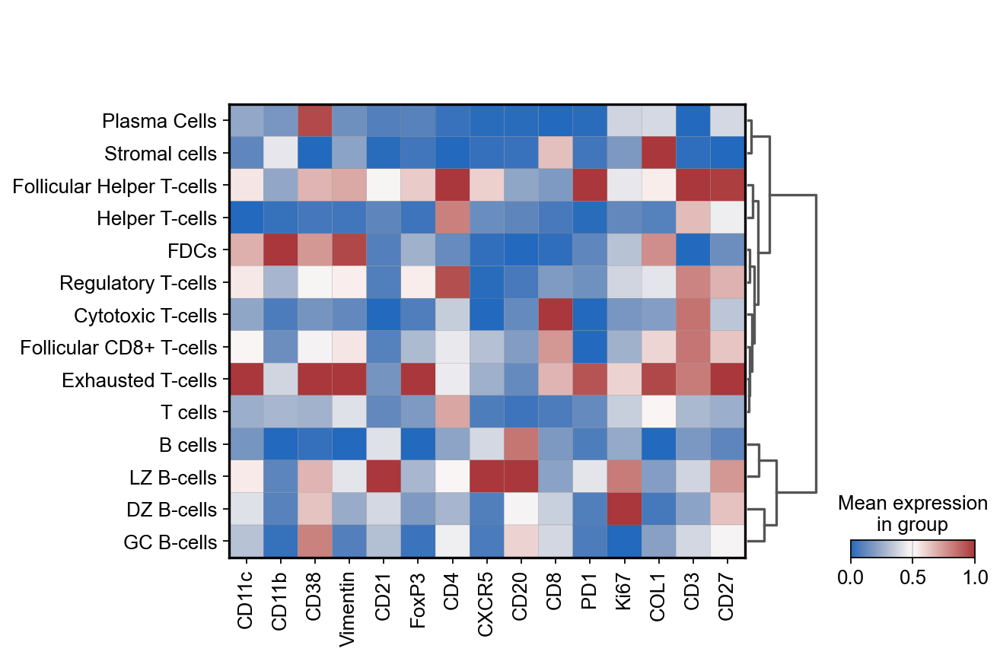

In [20]:
sc.tl.dendrogram(adata, groupby='Phenotype')
sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='Phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')


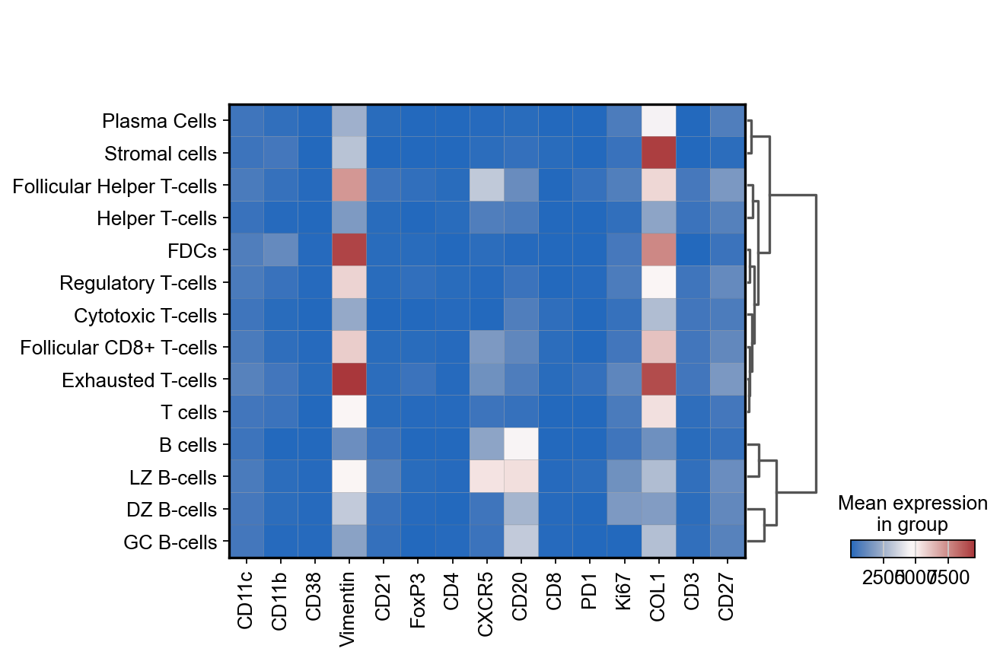

In [21]:
sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='Phenotype', dendrogram=True, use_raw=False, cmap="vlag")


In [22]:
import matplotlib 

var = 'Phenotype'

cluster_label_order = adata.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}




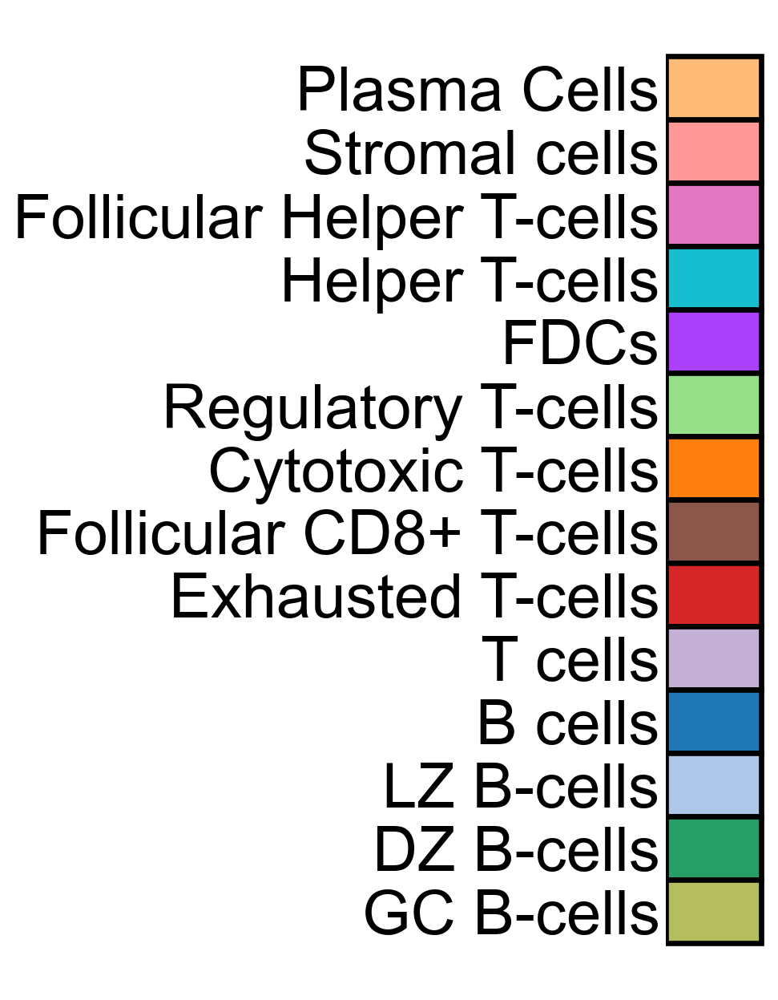

In [23]:
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

# legend
fig, ax = plt.subplots(figsize=(1,10))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=35)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


In [47]:
df_cluster_count.groupby("Dataset")["counts"].apply(lambda x: x / x.sum())

Dataset        
INT Donor B  10    0.215130
             11    0.165994
             17    0.113636
             23    0.088922
             32    0.060568
                     ...   
TS Donor E   71    0.002101
             77    0.000503
             81    0.000139
             82    0.000030
             83    0.000020
Name: counts, Length: 84, dtype: float64

In [39]:
var = 'Phenotype' 
df_cluster = pd.DataFrame()
df_cluster["Dataset"] = adata.obs['Dataset'].tolist()
df_cluster["Dataset"] = df_cluster["Dataset"].astype(str).astype('category')
df_cluster[var] = adata.obs['Phenotype'].tolist()
df_cluster_count = df_cluster.value_counts().to_frame('counts').reset_index()

df_cluster_count['Density'] = df_cluster_count.groupby("Dataset")["counts"].apply(lambda x: x / x.sum())

In [40]:
cluster_label_order = adata.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()
colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v/255 for k,v in zip(labels, colors_rgb)}

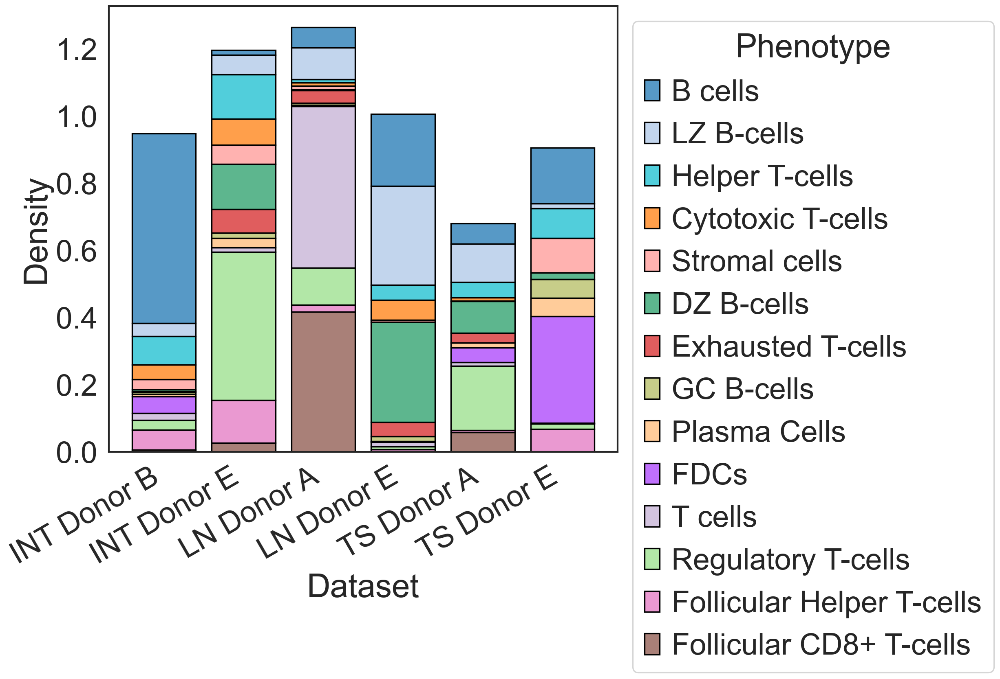

In [41]:
sns.set_style('white')
with sns.plotting_context('talk', font_scale=2):
    fig, ax = plt.subplots(figsize=(10, 9))
    ax = sns.histplot(data=df_cluster_count, x="Dataset" , hue=var, weights='Density', discrete=True, multiple='stack', shrink=0.8, palette=colors_rgb_dict, edgecolor='k',)
    ax.set_ylabel('Density')

    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))
    plt.xticks(rotation=30, ha='right')


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'B cells'),
  Text(1, 0, 'LZ B-cells'),
  Text(2, 0, 'Helper T-cells'),
  Text(3, 0, 'Cytotoxic T-cells'),
  Text(4, 0, 'Stromal cells'),
  Text(5, 0, 'DZ B-cells'),
  Text(6, 0, 'Exhausted T-cells'),
  Text(7, 0, 'GC B-cells'),
  Text(8, 0, 'Plasma Cells'),
  Text(9, 0, 'FDCs'),
  Text(10, 0, 'T cells'),
  Text(11, 0, 'Regulatory T-cells'),
  Text(12, 0, 'Follicular Helper T-cells'),
  Text(13, 0, 'Follicular CD8+ T-cells')])

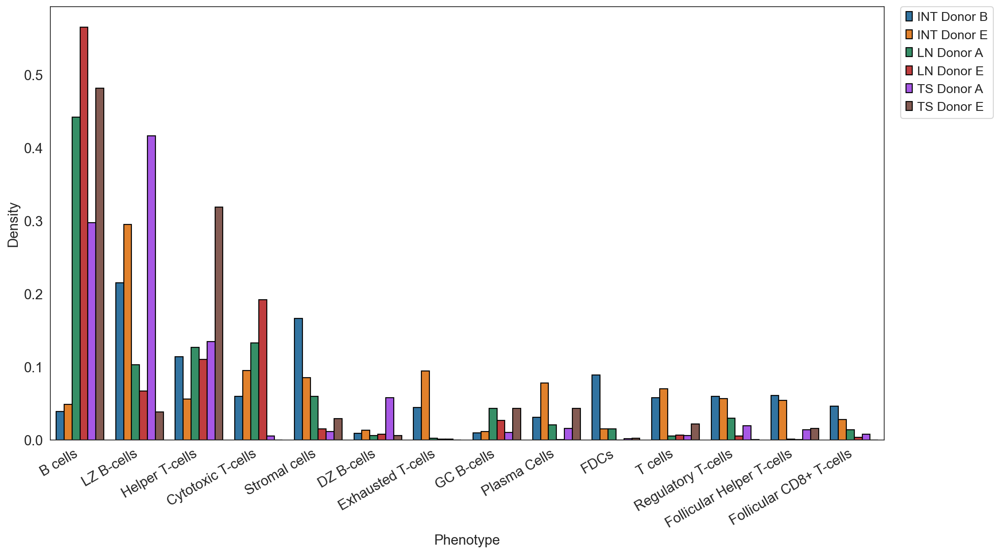

In [90]:
# Plot distribution
with sns.axes_style("white"):
    sns.barplot(data=df_cluster_count,  x="Phenotype" , hue='Dataset', y='Density', edgecolor='k')
    plt.gcf().set_size_inches(15, 8)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xticks(rotation = 30, ha='right')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'LZ B-cells'),
  Text(1, 0, 'Stromal cells'),
  Text(2, 0, 'Helper T-cells'),
  Text(3, 0, 'FDCs'),
  Text(4, 0, 'Follicular Helper T-cells'),
  Text(5, 0, 'Cytotoxic T-cells'),
  Text(6, 0, 'Regulatory T-cells'),
  Text(7, 0, 'T cells'),
  Text(8, 0, 'Follicular CD8+ T-cells'),
  Text(9, 0, 'Exhausted T-cells'),
  Text(10, 0, 'B cells'),
  Text(11, 0, 'Plasma Cells'),
  Text(12, 0, 'GC B-cells'),
  Text(13, 0, 'DZ B-cells')])

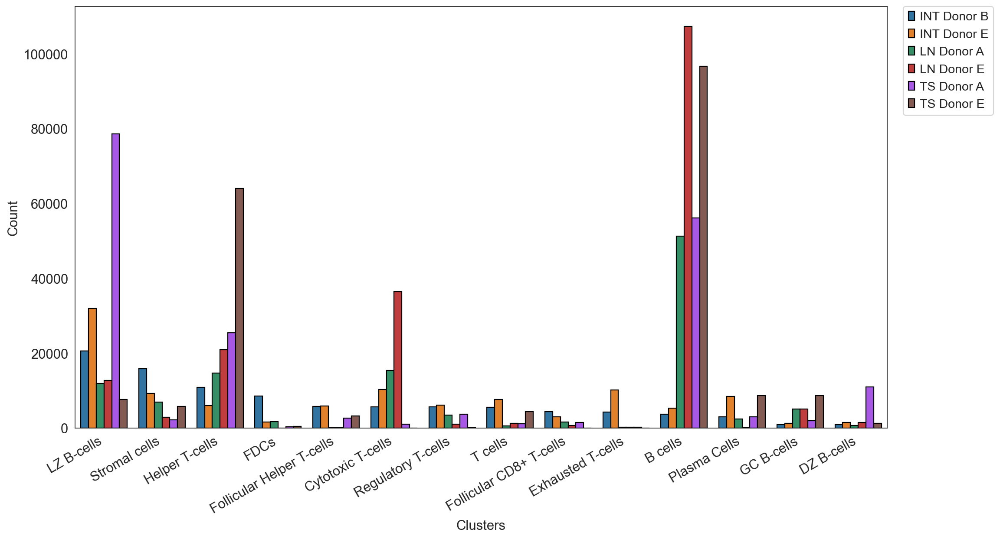

In [91]:
# Get cluster dataframe 
df_test = pd.DataFrame()
df_test['Dataset'] = adata.obs['Dataset'].tolist()
df_test['Clusters'] = adata.obs['Phenotype'].tolist()

# Plot distribution
df_test_grouped = df_test.groupby('Dataset')['Clusters'].value_counts(normalize=False).rename('Count').reset_index()
with sns.axes_style("white"):
    sns.barplot(data=df_test_grouped, x='Clusters', y='Count', hue='Dataset', edgecolor='k')
    plt.gcf().set_size_inches(15, 8)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xticks(rotation = 30, ha='right')

In [92]:
donors = adata.obs.Dataset.unique()
dfs = []

for donor in donors:
    adata_subset = adata[adata.obs.Dataset == donor,:]
    
    # Summary of the phenotyping
    
    df = pd.DataFrame(adata_subset.obs['Phenotype'].value_counts())
    df.columns=[donor]
    dfs.append(df)
    
df = pd.concat(dfs, axis=1)

In [93]:
df.to_clipboard()

In [94]:
df

,LN Donor A,LN Donor E,INT Donor B,INT Donor E,TS Donor A,TS Donor E
B cells,51277,107282,3705,5283,56189,96680
Cytotoxic T-cells,15410,36426,5702,10315,1072,28
Helper T-cells,14727,20890,10865,6035,25457,63991
LZ B-cells,11959,12768,20569,31957,78636,7651
Stromal cells,6944,2818,15871,9236,2148,5825
GC B-cells,5027,5031,917,1243,1958,8690
Regulatory T-cells,3470,1040,5696,6106,3700,101
Plasma Cells,2390,48,2963,8432,2977,8669
FDCs,1725,31,8502,1612,377,422
Follicular CD8+ T-cells,1596,636,4389,3015,1451,4


# Generate cell mask images

In [95]:
import matplotlib 
from PIL import Image

def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1],3), dtype=np.uint8)

    # for i, cells in tqdm(label2cell.items(), total=len(label2cell), leave=False):
    for i, cells in label2cell.items():
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]
    return img


def get_img_size(roi_dict, size=1000):
    row_max = 0
    col_max = 0
    for k, v in roi_dict.items():
        row_max = max(row_max, v[0])
        col_max = max(col_max, v[1])
    return row_max + size, col_max + size

# Read mask image
def get_masks(mask_folder):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition =  name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


In [96]:
masks = {}
for d in all_donor:
    masks[d] = get_masks(data_dir / 'masks' / d)

In [97]:
colors = adata.uns["Phenotype_colors"]
labels = adata.obs.Phenotype.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

In [98]:
# Format row, col
arrangement = {
    "LN Donor A": {
        1: [0, 1000],
        2: [0, 2000],
        3: [1000, 0],
        4: [1000, 1000],
        5: [1000, 2000],
        6: [1000, 3000],
        7: [2000, 0],
        8: [2000, 1000],
        9: [2000, 2000],
        10: [2000, 3000],
        11: [3000, 0],
        12: [3000, 1000],
        13: [3000, 2000],
        14: [3000, 3000],
        15: [4000, 1000],
        16: [4000, 2000],
    },
    "LN Donor E": {
        1: [1000, 0],
        2: [1000, 1000],
        3: [1000, 2000],
        4: [1000, 3000],
        5: [1000, 4000],
        6: [1000, 5000],
        7: [1000, 6000],
        8: [1000, 7000],
        9: [1000, 8000],
        10: [0, 0],
        11: [0, 1000],
        12: [0, 2000],
        13: [0, 3000],
        14: [0, 4000],
    },
    "INT Donor B": {
        1: [0, 0],
        2: [0, 1000],
        3: [1000, 0],
        4: [1000, 1000],
        5: [2000, 0],
        6: [2000, 1000],
        7: [2000, 2000],
        8: [2000, 3000],
        9: [3000, 0],
        10: [3000, 1000],
        11: [3000, 2000],
        12: [3000, 3000],
        13: [4000, 0],
        14: [4000, 1000],
        15: [4000, 2000],
        16: [4000, 3000],
        # 17: [5000, 0],
        # 18: [5000, 1000],
        # 19: [5000, 2000],
        # 20: [5000, 3000],
    },
    "INT Donor E": {
        1: [0, 0],
        2: [0, 1000],
        3: [0, 2000],
        4: [0, 3000],
        # 5: [0, 4000],
        6: [1000, 0],
        7: [1000, 1000],
        8: [1000, 2000],
        9: [1000, 3000],
        10: [1000, 4000],
        11: [2000, 3000],
        12: [2000, 4000],
        13: [3000, 3000],
        14: [3000, 4000],
        15: [4000, 3000],
        16: [4000, 4000],
    },
    "TS Donor A": {
        1: [0, 0],
        2: [0, 1000],
        3: [0, 2000],
        4: [0, 3000],
        5: [0, 4000],
        6: [0, 5000],
        7: [0, 6000],
        8: [1000, 0],
        9: [1000, 1000],
        10: [1000, 2000],
        11: [1000, 3000],
        12: [1000, 4000],
        13: [1000, 5000],
        14: [1000, 6000],
    },
    "TS Donor E": {
        1: [0, 0],
        2: [0, 1000],
        3: [0, 2000],
        4: [1000, 0],
        5: [1000, 1000],
        6: [1000, 2000],
        7: [2000, 0],
        8: [2000, 1000],
        9: [2000, 2000],
        10: [3000, 0],
        11: [3000, 1000],
        12: [3000, 2000],
        13: [4000, 0],
        14: [4000, 1000],
        15: [4000, 2000],
        16: [5000, 0],
        17: [5000, 1000],
        18: [5000, 2000],
    },
    "SP Donor A": {
        1: [0, 0],
        2: [0, 1000],
        3: [0, 2000],
        4: [0, 3000],
        5: [0, 4000],
        6: [1000, 0],
        7: [1000, 1000],
        8: [1000, 2000],
        9: [1000, 3000],
        10: [1000, 4000],
        11: [2000, 0],
        12: [2000, 1000],
        13: [2000, 2000],
        14: [2000, 3000],
        15: [2000, 4000],
        16: [3000, 0],
        17: [3000, 1000],
        18: [3000, 2000],
        19: [3000, 3000],
        20: [3000, 4000],
    },
}

In [99]:
size = 1000

for d in adata.obs.Dataset.unique():
    adata_donor = adata[adata.obs.Dataset == d, :]

    # Create combined images
    y_max, x_max = get_img_size(arrangement[d])
    img_combined = np.zeros((y_max, x_max, 3), dtype=np.uint8)

    for i in adata_donor.obs.ROI.unique():
        if i not in arrangement[d].keys():
            continue

        # Get dataset
        adata_subset = adata_donor[adata_donor.obs.ROI == i, :]

        # Get mask
        mask = masks[d][str(int(i))]

        # Get label2cell dict
        label2cell = {}
        for j, l in enumerate(labels):
            cell_id = adata_subset[adata_subset.obs.Phenotype == l].obs.Cell_label.to_list()
            label2cell[j] = cell_id

        img = create_clustered_cell(mask, label2cell, colors_rgb)

        # Insert to combine image
        y = max(0, arrangement[d][i][0] - 1)
        x = max(0, arrangement[d][i][1] - 1)
        img_combined[y : y + size, x : x + size] = img

    save_path = p_dir / "figures" / "Clustering" / f"Phenotype_Manual_{d}_new.png"
    img_combined = Image.fromarray(img_combined)
    img_combined.save(save_path)


# Generate TSNE

In [100]:
import openTSNE

In [101]:
%%time
aff50 = openTSNE.affinity.PerplexityBasedNN(
    adata.obsm['X_scanorama'],
    perplexity=50,
    n_jobs=32,
    random_state=0,
)

CPU times: total: 26min 26s
Wall time: 4min 33s


In [102]:
%%time
init = openTSNE.initialization.pca(adata.obsm['X_scanorama'], random_state=0)

CPU times: total: 49.1 s
Wall time: 2.39 s


In [103]:
%%time
embedding = openTSNE.TSNE(
    n_jobs=32,
    verbose=True,
).fit(affinities=aff50, initialization=init)

--------------------------------------------------------------------------------
TSNE(n_jobs=32, verbose=True)
--------------------------------------------------------------------------------
===> Running optimization with exaggeration=12.00, lr=74993.42 for 250 iterations...
Iteration   50, KL divergence 8.3745, 50 iterations in 35.6581 sec
Iteration  100, KL divergence 7.8302, 50 iterations in 36.0032 sec
Iteration  150, KL divergence 7.6404, 50 iterations in 35.6282 sec
Iteration  200, KL divergence 7.5292, 50 iterations in 35.8173 sec
Iteration  250, KL divergence 7.4518, 50 iterations in 36.1983 sec
   --> Time elapsed: 179.31 seconds
===> Running optimization with exaggeration=1.00, lr=74993.42 for 500 iterations...
Iteration   50, KL divergence 6.0242, 50 iterations in 34.8982 sec
Iteration  100, KL divergence 5.2982, 50 iterations in 34.8494 sec
Iteration  150, KL divergence 4.8768, 50 iterations in 35.9067 sec
Iteration  200, KL divergence 4.5971, 50 iterations in 37.2662 sec


In [104]:
adata.obsm['X_tsne'] = np.array(embedding)

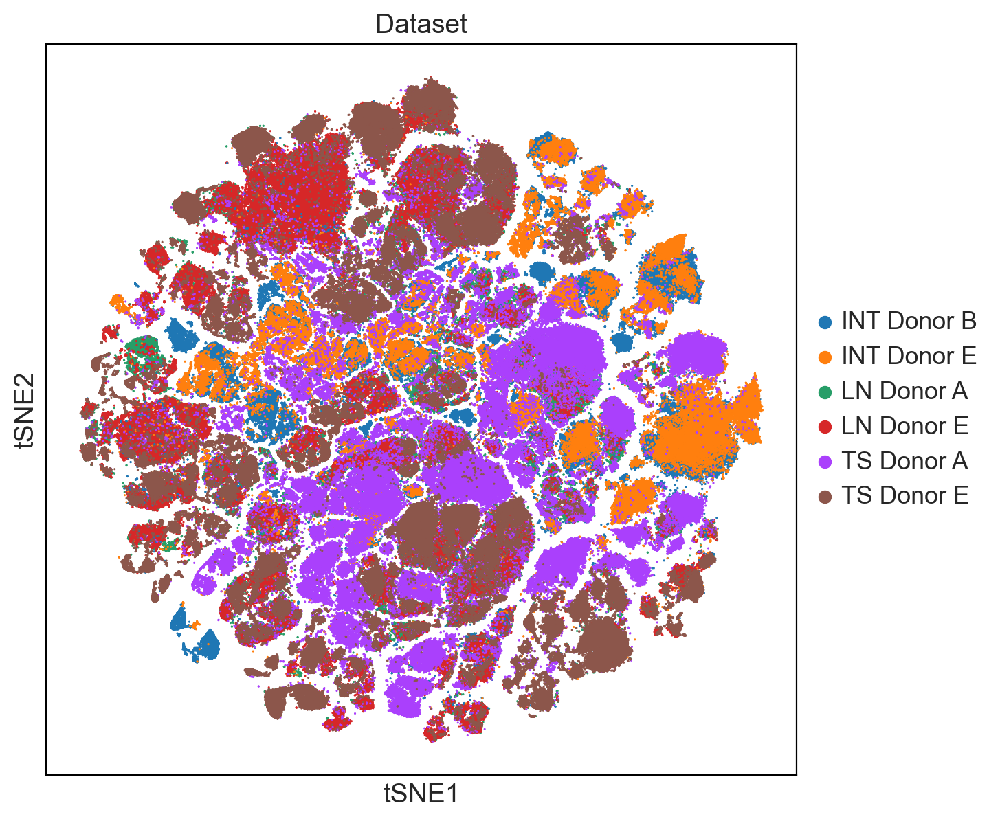

In [111]:
sc.set_figure_params(format='png')

with rc_context({'figure.figsize': (7, 7), 'figure.dpi': 100}):
    fig = sc.pl.tsne(adata, color=['Dataset'], size=5)

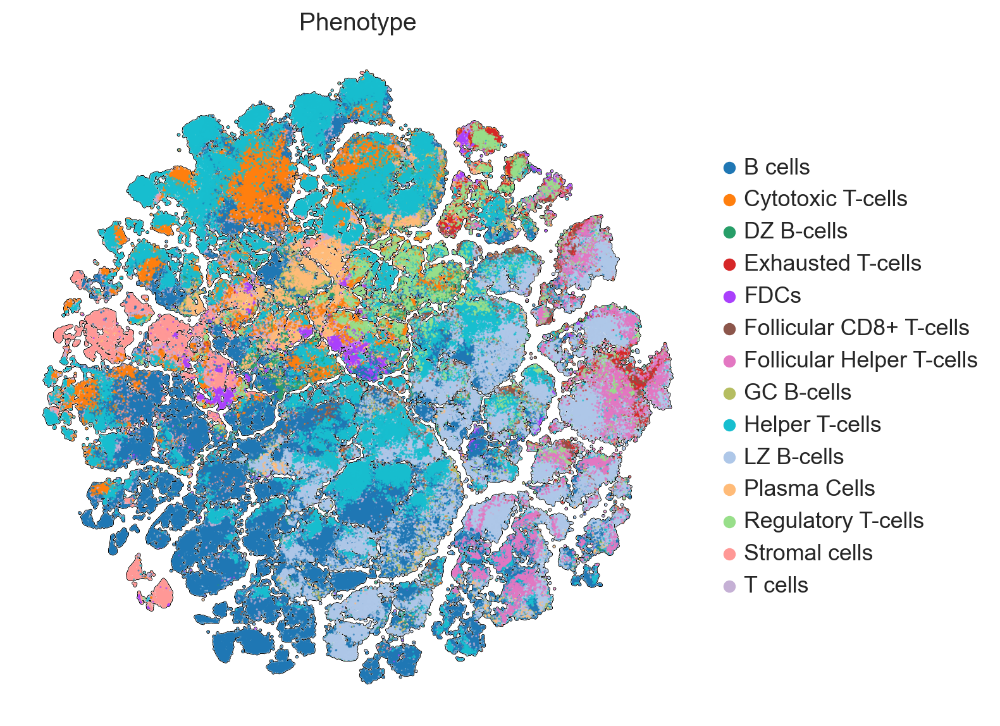

In [112]:
sc.set_figure_params(format='png')

with rc_context({'figure.figsize': (7, 7), 'figure.dpi': 100}):
    fig = sc.pl.tsne(adata, color=['Phenotype'], size=5, add_outline=True, frameon=False)

In [115]:
all_donor

['LN Donor A',
 'LN Donor E',
 'INT Donor B',
 'INT Donor E',
 'TS Donor A',
 'TS Donor E']

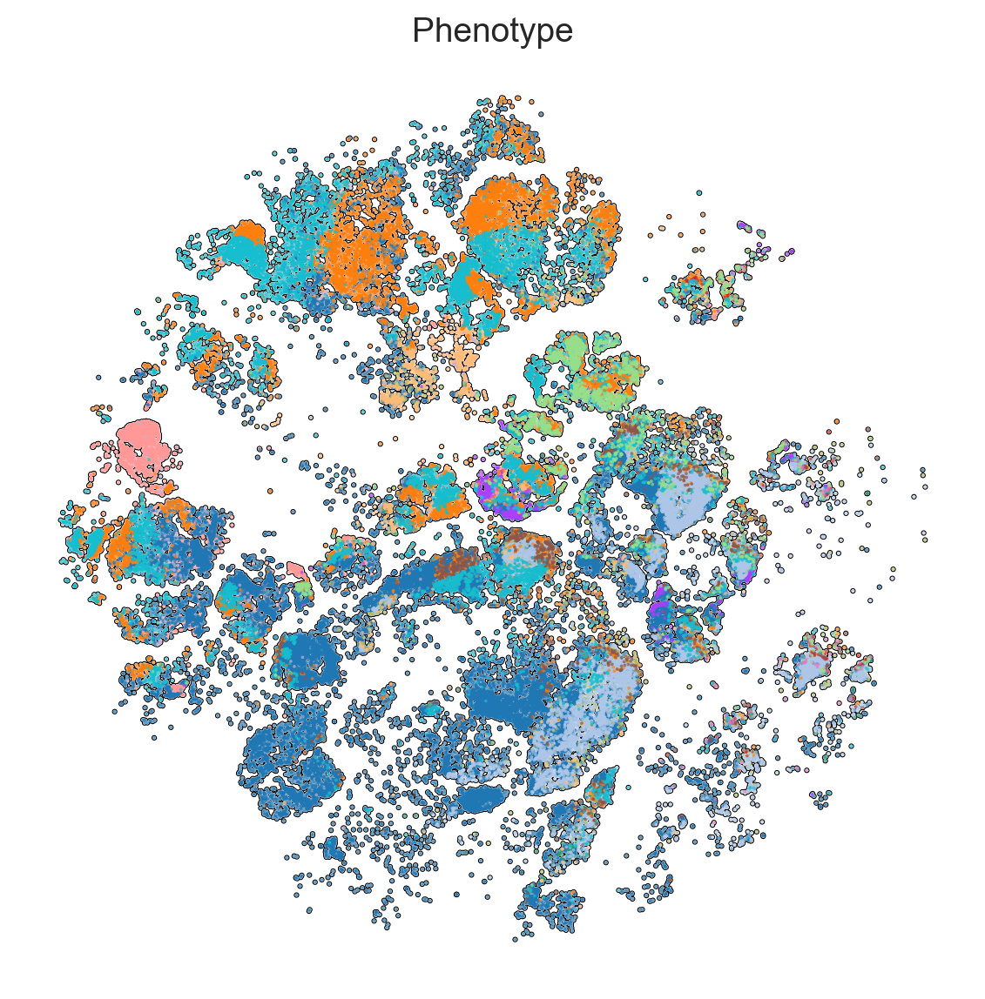

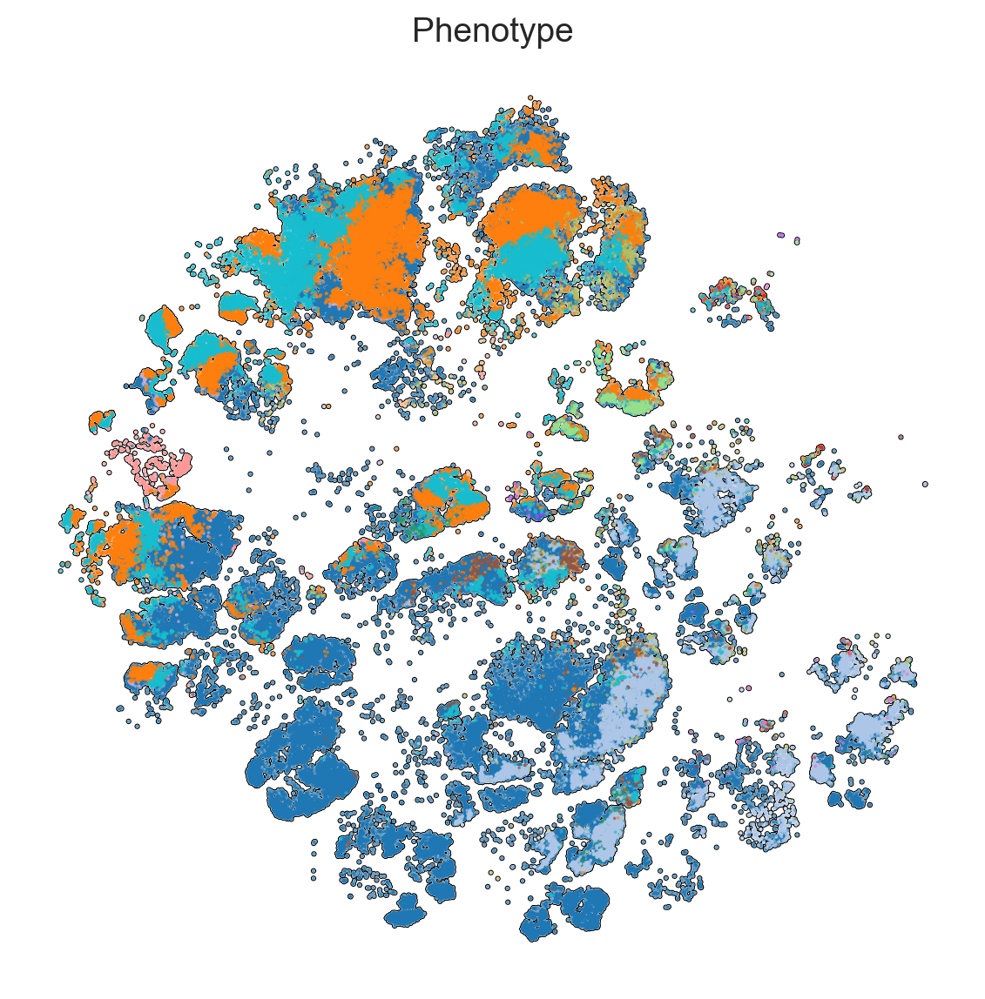

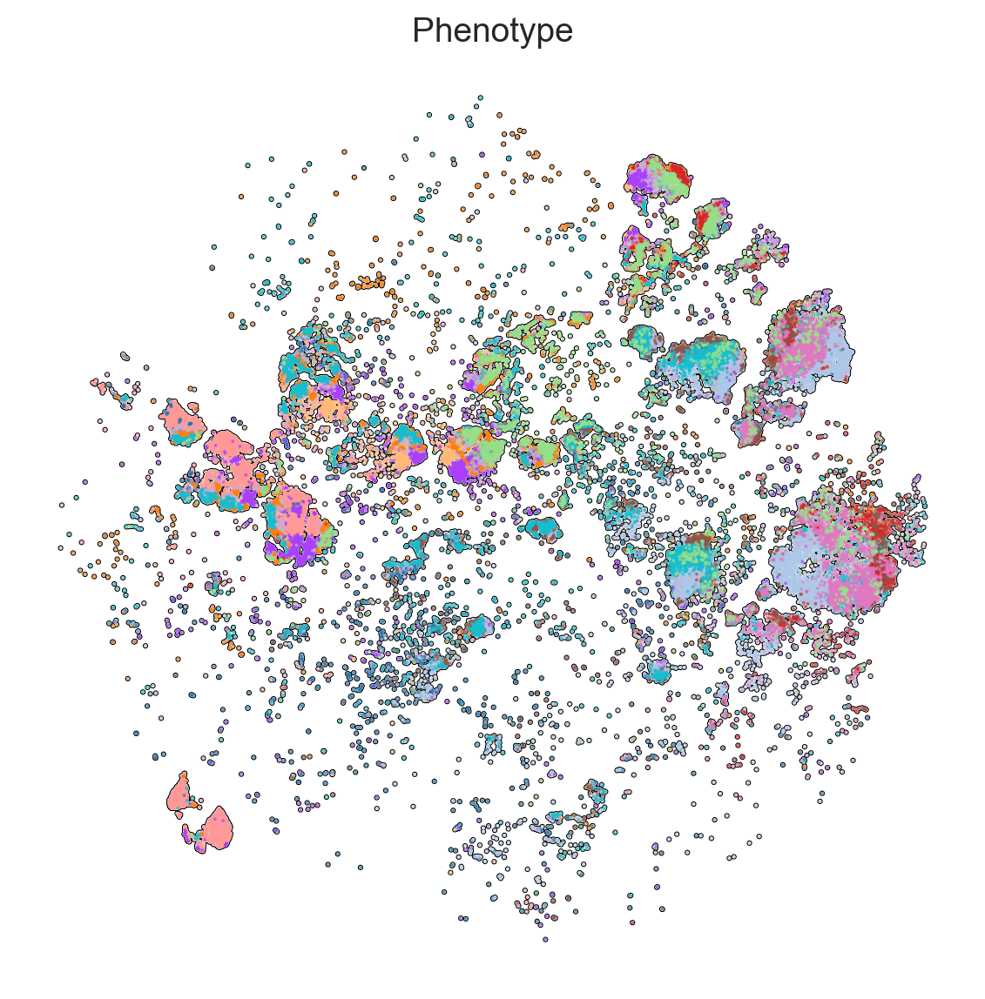

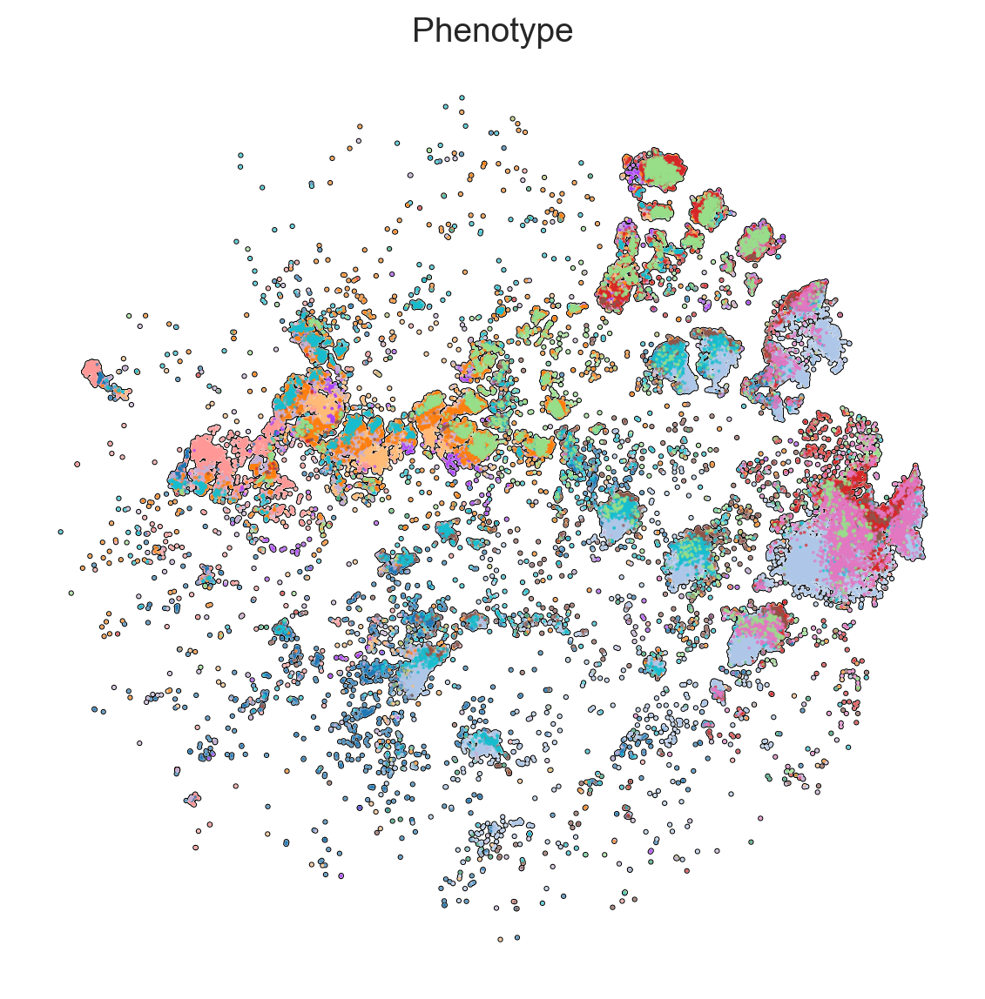

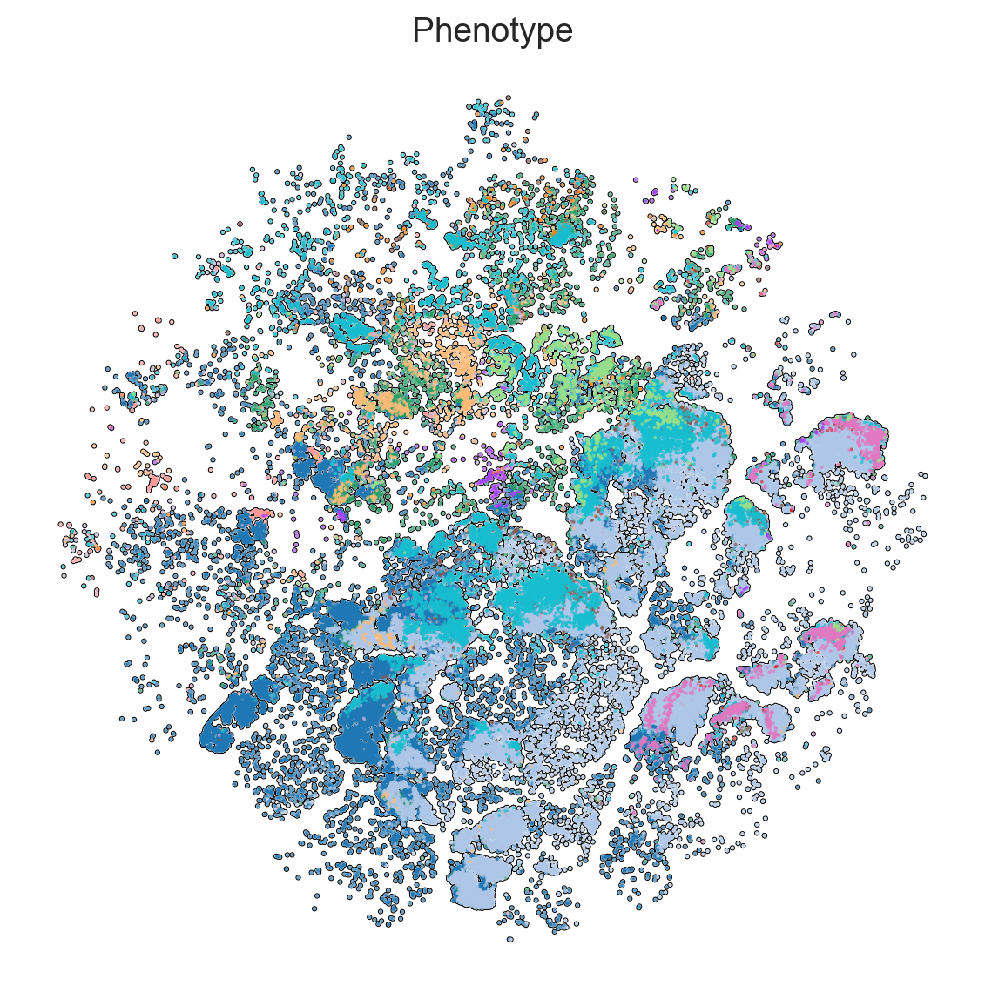

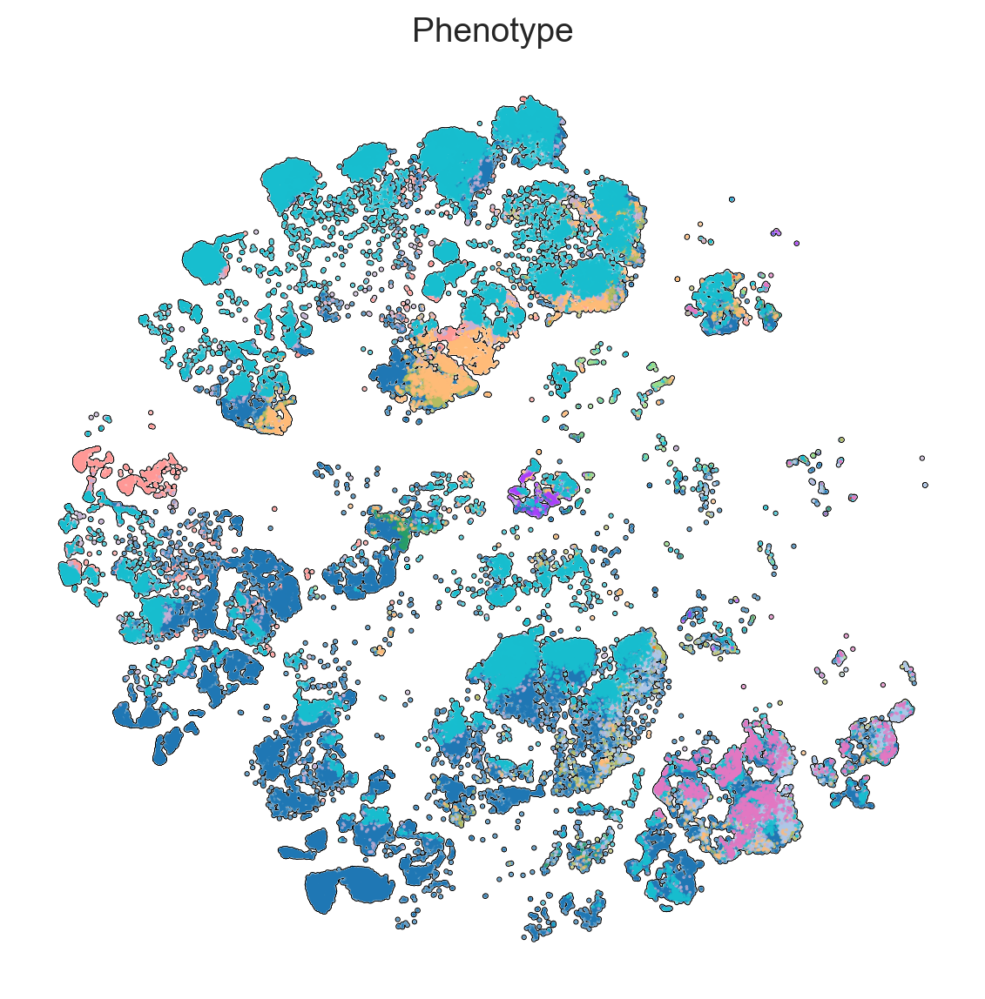

In [113]:
for donor in all_donor:
    adata_subset = adata[adata.obs.Dataset == donor,:]

    with rc_context({'figure.figsize': (7, 7), 'figure.dpi': 100}):
        fig = sc.pl.tsne(adata_subset, color=['Phenotype'], size=7, legend_loc=None, add_outline=True, frameon=False)

# Save adata

In [108]:
adata_path = data_dir / "metadata" / f"combined_flowjo.h5ad"
adata.write(adata_path)